In [55]:
# ========== BASIC IMPORTS ==========
import os
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ========== TORCH IMPORTS ==========
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import segmentation_models_pytorch as smp
from torch.utils.data import random_split

# ========== SKLEARN METRICS ==========
from sklearn.metrics import accuracy_score, roc_auc_score

# ========== AUGMENTATION ==========
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [9]:
%pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 34.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [15]:
# ====== Dataset ====== #
class HistologyDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (512, 512))

        if self.transform:
            image = self.transform(image)

        return image

# ====== Metrics ====== #
def dice_coefficient(pred, target):
    smooth = 1e-6
    pred = (pred > 0.5).float()
    target = (target > 0.5).float()
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def iou_score(pred, target):
    smooth = 1e-6
    pred = (pred > 0.5).float()
    target = (target > 0.5).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

# ====== Data Paths ====== #
img_dir = "/gpfs/scratch/hz3106/Gashisdb/cancer_Sub_Ori_train1"
all_image_paths = sorted(glob.glob(os.path.join(img_dir, "*.png")))

train_paths, temp_paths = train_test_split(all_image_paths, test_size=0.3, random_state=42)
val_paths, test_paths = train_test_split(temp_paths, test_size=0.5, random_state=42)

transform = T.Compose([

    
    T.ToTensor(),   # (H, W, C) ➔ (C, H, W) and scales to [0,1]
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = HistologyDataset(train_paths, transform=transform)
val_dataset = HistologyDataset(val_paths, transform=transform)
test_dataset = HistologyDataset(test_paths, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

#  U-Net trained to reconstruct image (unsupervised-ish)

Workflow

1. Train a U-Net model to generate soft masks (no hard thresholding).
2. U-Net trained to reconstruct mean grayscale structure of input images.
3. Apply soft masks to original RGB images during training.
4. Train a separate ResNet18-based classifier using masked images.
5. Perform binary classification (normal vs abnormal tissue).
6. Monitor loss and accuracy per epoch; no AUC emphasized due to small batches and binary setup.

Goal: Use U-Net autoencoder to guide the classifier to focus on more meaningful regions and improve detection of abnormalities.
-  Force the U-Net to learn useful features/regions (like tumor areas).
- After training, the predicted mask highlights “interesting” areas.
- Later we can use U-Net’s segmentation to improve classifier training 


## UNet  

In [86]:
import os
import glob
from PIL import Image
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Set base directory
base_dir = "/gpfs/scratch/hz3106/Gashisdb"

# Set correct full paths
train_dirs = [os.path.join(base_dir, "cancer_Sub_Ori_train1"),
              os.path.join(base_dir, "cancer_Sub_Ori_train2")]

val_dirs = [os.path.join(base_dir, "cancer_Sub_Ori_val1"),
            os.path.join(base_dir, "cancer_Sub_Ori_val2")]

test_dirs = [os.path.join(base_dir, "cancer_Sub_Ori_test1"),
             os.path.join(base_dir, "cancer_Sub_Ori_test2"),
             os.path.join(base_dir, "cancer_Sub_Ori_test3"),
             os.path.join(base_dir, "cancer_Sub_Ori_test4")]

# Helper function to load image paths
def load_image_paths(dirs):
    all_paths = []
    for d in dirs:
        all_paths += sorted(glob.glob(os.path.join(d, "*.png")))
    return all_paths

# Load image paths
train_paths = load_image_paths(train_dirs)
val_paths = load_image_paths(val_dirs)
test_paths = load_image_paths(test_dirs)

# Define Dataset
class HistologyDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, img_path  # Return both the image tensor and the path

# Image transformations
img_size = 120  # 120x120 images based on your previous Gashisdb processing
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

# Dataloaders
batch_size = 8
train_loader = DataLoader(HistologyDataset(train_paths, transform), batch_size=batch_size, shuffle=True)
val_loader = DataLoader(HistologyDataset(val_paths, transform), batch_size=batch_size, shuffle=False)
test_loader = DataLoader(HistologyDataset(test_paths, transform), batch_size=batch_size, shuffle=False)

Defines, trains, and saves a simple U-Net model for unsupervised segmentation-like learning. 
- The U-Net architecture consists of an encoder-decoder structure with skip connections between layers of the same spatial size. 
- In this specific setup, the U-Net is trained without real segmentation masks: instead, it is trained to predict a gray-scale (single-channel mean) version of the input RGB images. 
    - That is, for each input image, the target is the average across its RGB channels, making the task roughly resemble foreground extraction or denoising. During training, the loss is computed using Mean Squared Error (MSE) between the U-Net’s output and the grayscale target. 
- After 20 epochs of training, the U-Net’s weights are saved to ./unet_gastric_segmentation.pth in the current working directory. 

In [76]:
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define simple U-Net
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = DoubleConv(3, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)
        self.pool = nn.MaxPool2d(2)

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        
        d3 = self.upconv3(e4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)
        
        d2 = self.upconv2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        
        d1 = self.upconv1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)
        
        return self.final(d1)

In [77]:
# Initialize model
unet = UNet().to(device)
optimizer = optim.Adam(unet.parameters(), lr=1e-4)
criterion = nn.MSELoss()

# Train
num_epochs = 20
for epoch in range(num_epochs):
    unet.train()
    running_loss = 0.0
    for imgs, _ in train_loader:
        imgs = imgs.to(device)
        preds = unet(imgs)
        loss = criterion(preds, imgs.mean(dim=1, keepdim=True))  # Target = simple gray version of itself
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {running_loss/len(train_loader):.4f}")

# Save UNet model into current working directory
torch.save(unet.state_dict(), "./unet_gastric_segmentation.pth")

Epoch [1/20] Loss: 0.3562
Epoch [2/20] Loss: 0.0996
Epoch [3/20] Loss: 0.0348
Epoch [4/20] Loss: 0.0144
Epoch [5/20] Loss: 0.0079
Epoch [6/20] Loss: 0.0049
Epoch [7/20] Loss: 0.0039
Epoch [8/20] Loss: 0.0035
Epoch [9/20] Loss: 0.0030
Epoch [10/20] Loss: 0.0024
Epoch [11/20] Loss: 0.0023
Epoch [12/20] Loss: 0.0022
Epoch [13/20] Loss: 0.0020
Epoch [14/20] Loss: 0.0018
Epoch [15/20] Loss: 0.0018
Epoch [16/20] Loss: 0.0017
Epoch [17/20] Loss: 0.0016
Epoch [18/20] Loss: 0.0016
Epoch [19/20] Loss: 0.0014
Epoch [20/20] Loss: 0.0012


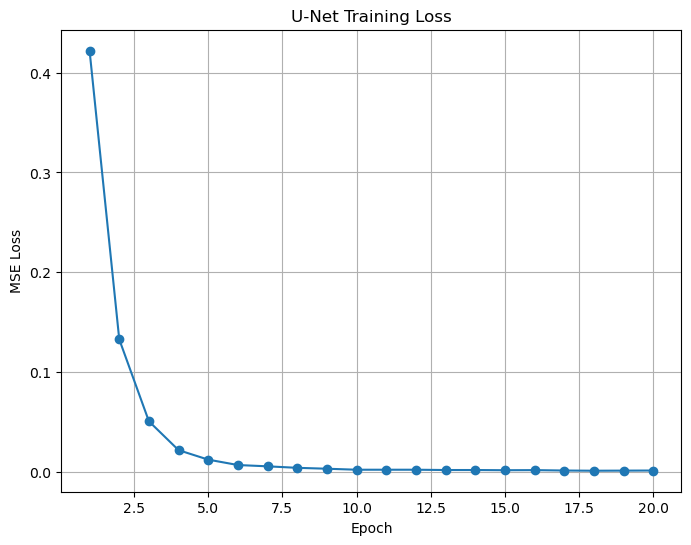

In [4]:
import matplotlib.pyplot as plt

# Plot the losses
losses = [
    0.4219, 0.1328, 0.0507, 0.0218, 0.0123, 0.0069, 0.0056, 0.0041, 0.0032, 0.0022,
    0.0022, 0.0022, 0.0019, 0.0019, 0.0017, 0.0018, 0.0014, 0.0012, 0.0013, 0.0014
]

# Plot
plt.figure(figsize=(8,6))
plt.plot(range(1, 21), losses, marker='o')
plt.title('U-Net Training Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.grid()
plt.show()

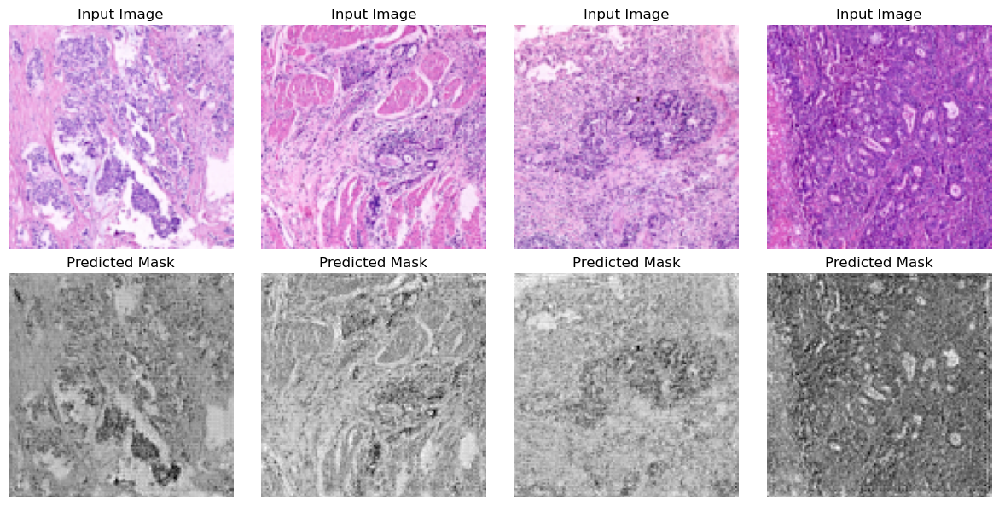

In [6]:
### Plot Input Image vs Soft Mask ####
unet.eval()

# Load a batch
imgs, _ = next(iter(train_loader))
imgs = imgs.to(device)

# Predict masks
with torch.no_grad():
    preds = torch.sigmoid(unet(imgs))  # Apply sigmoid to get 0-1

# Move to CPU
imgs = imgs.cpu()
preds = preds.cpu()

# Plot few examples
n = 4  # Number of examples
plt.figure(figsize=(12, 6))
for i in range(n):
    # Input image
    plt.subplot(2, n, i+1)
    img = imgs[i].permute(1, 2, 0).numpy()
    img = (img - img.min()) / (img.max() - img.min())  # Normalize
    plt.imshow(img)
    plt.axis('off')
    plt.title('Input Image')
    
    # Predicted mask
    plt.subplot(2, n, n+i+1)
    mask = preds[i, 0].numpy()
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.title('Predicted Mask')

plt.tight_layout()
plt.show()

	•	Top: original histopathology input image (normalized)
	•	Bottom: the U-Net predicted soft mask (grayscale, values 0 to 1)

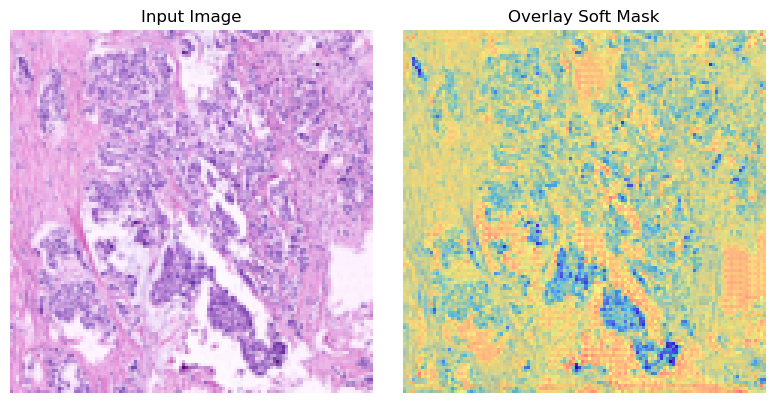

In [7]:
###### Overlay Soft Mask on Image###
# Pick one example
idx = 0

input_img = imgs[idx].permute(1, 2, 0).numpy()
input_img = (input_img - input_img.min()) / (input_img.max() - input_img.min())
mask = preds[idx, 0].numpy()

plt.figure(figsize=(8,4))

# Input image
plt.subplot(1, 2, 1)
plt.imshow(input_img)
plt.axis('off')
plt.title('Input Image')

# Overlayed
plt.subplot(1, 2, 2)
plt.imshow(input_img)
plt.imshow(mask, cmap='jet', alpha=0.5)  # soft mask overlay
plt.axis('off')
plt.title('Overlay Soft Mask')

plt.tight_layout()
plt.show()

In [8]:
print(f"Predicted mask min value: {preds.min().item():.4f}")
print(f"Predicted mask max value: {preds.max().item():.4f}")

Predicted mask min value: 0.6150
Predicted mask max value: 0.7559


In [9]:
for i in range(preds.shape[0]):  # Loop over batch
    print(f"Image {i}: Min={preds[i].min().item():.4f}, Max={preds[i].max().item():.4f}")

Image 0: Min=0.6471, Max=0.7550
Image 1: Min=0.6331, Max=0.7425
Image 2: Min=0.6150, Max=0.7432
Image 3: Min=0.6221, Max=0.7350
Image 4: Min=0.6488, Max=0.7419
Image 5: Min=0.6578, Max=0.7443
Image 6: Min=0.6395, Max=0.7559
Image 7: Min=0.6385, Max=0.7551


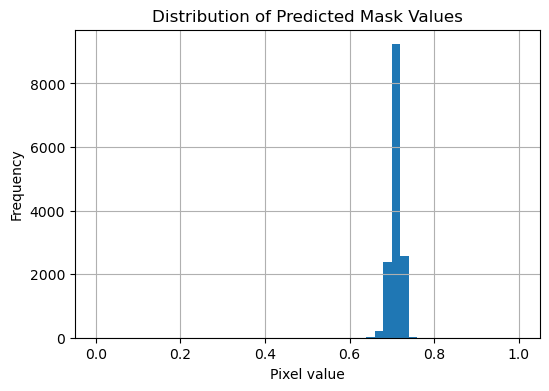

In [10]:
import matplotlib.pyplot as plt

# Assuming preds is [batch_size, 1, H, W]
pred_sample = preds[0, 0].detach().cpu().numpy()  # Pick first sample

# Plot histogram
plt.figure(figsize=(6, 4))
plt.hist(pred_sample.flatten(), bins=50, range=(0,1))
plt.title("Distribution of Predicted Mask Values")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.grid()
plt.show()

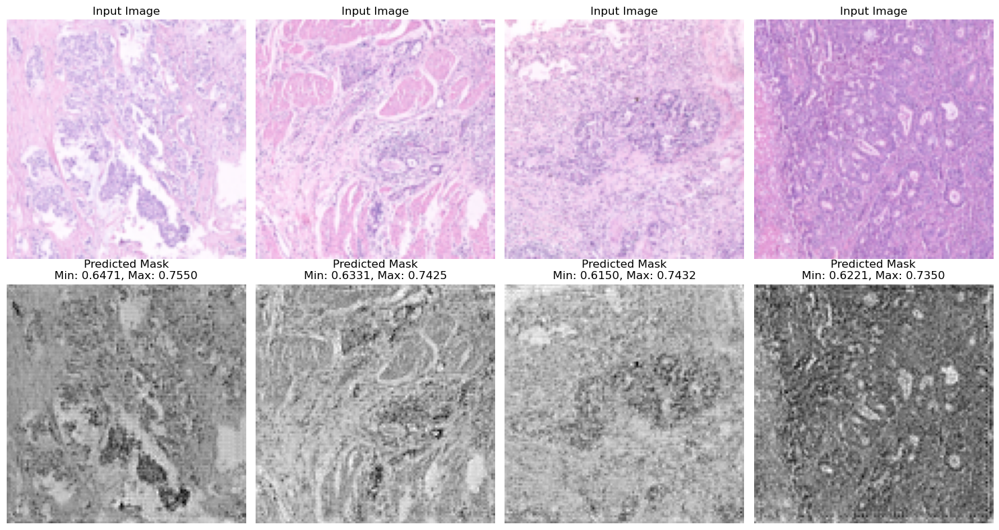

In [11]:
import matplotlib.pyplot as plt
import torch

# Assume preds and imgs are already loaded and predicted

fig, axes = plt.subplots(2, 4, figsize=(15, 8))

for i in range(4):  # Show 4 examples
    # Top: Input image
    axes[0, i].imshow(imgs[i].permute(1, 2, 0).cpu())
    axes[0, i].set_title("Input Image")
    axes[0, i].axis('off')

    # Bottom: Predicted mask
    mask = preds[i][0].cpu().detach().numpy()  # Assume shape [batch, 1, H, W]
    axes[1, i].imshow(mask, cmap='gray')
    axes[1, i].set_title(f"Predicted Mask\nMin: {mask.min():.4f}, Max: {mask.max():.4f}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

- Each pixel has a value between 0 and 1.
	- Higher value (closer to 1) = more likely the pixel belongs to tumor (foreground)
	- Lower value (closer to 0) = more likely the pixel is background (non-tumor) =
    - Min = The smallest pixel value in the mask = lowest predicted confidence
    - Max = the highest predicted confidence
- U-Net predicted masks are very smooth and continuous, not binary (i.e., not strict 0 or 1).
	- The pixel values range between ~0.61 and ~0.76 across all images.
- The histogram shows that the pixel values are tightly clustered between ~0.62 to ~0.76 and almost no values are near 0 or 1.
    - This means the U-Net is producing soft masks, the output is like a soft heatmap rather than a hard segmentation where pixels are either entirely 0 or entirely 1.
- Therefore the model is outputting soft grayscale masks (continuous values between 0 and 1), not binary masks.
- The histological image again 	shows that the model predicts soft probabilities (it doesn’t say “this pixel is tumor” or “this pixel is not tumor” directly)
	- The mask is very “smooth” — not sharply black and white.
	- No pixels are near 0 → the model is never very confident that something is “definitely not tumor.” It thinks most of the image contains some moderate tumor probability. It is not sharply separating tumor vs background yet.

## After Unet

- Trained U-Net used to generate soft masks that highlight important regions of the histopathology images, enabling weakly supervised tasks like masked classification.
- I use these learned masks to guide the training of a second classifier model. 
    - Element-wise multiply the original images by their corresponding soft masks to suppress irrelevant background information while keeping important features emphasized. 
    - These masked images are fed into a pre-trained and fine-tuned ResNet-based classifier model — specifically, a Gradual Fully Connected (Gradual FC) ResNet18 architecture originally developed by my teammate. 
- During training, the classifier learns to predict whether each masked image corresponds to a normal or abnormal tissue sample. 
    - I evaluate the training and validation loss and accuracy at each epoch to monitor performance. 
- This two-step process of soft masking followed by classification aims to **improve the model’s focus on biologically meaningful regions while reducing noise from irrelevant areas.**

In [79]:
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

UNet(
  (enc1): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (enc2): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (enc3): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=

In [80]:
# Total number of samples per class (only on TRAINING set)
num_normal = sum([1 for label in train_labels if label == 0])
num_abnormal = sum([1 for label in train_labels if label == 1])

# Inverse frequency weighting
weight_normal = 1.0 / num_normal
weight_abnormal = 1.0 / num_abnormal

class_weights = torch.tensor([weight_normal, weight_abnormal], dtype=torch.float).to(device)

print(f"Class Weights: {class_weights}")

Class Weights: tensor([6.0724e-05, 1.0668e-05], device='cuda:0')


In [81]:
# -------------------- AFTER UNET TRAINING --------------------
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Assume device is already set
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Load trained UNet ---
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

# --- Define GradualFCGastricCNN again (same definition as classification) ---
class GradualFCGastricCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(GradualFCGastricCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU(inplace=True)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.relu2 = nn.ReLU(inplace=True)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.relu3 = nn.ReLU(inplace=True)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.relu4 = nn.ReLU(inplace=True)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc_layers = nn.Sequential(
            nn.Linear(256*7*7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(2048, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(32, num_classes)
        )

    def forward(self, x):
        x = self.pool1(self.relu1(self.bn1(self.conv1(x))))
        x = self.pool2(self.relu2(self.bn2(self.conv2(x))))
        x = self.pool3(self.relu3(self.bn3(self.conv3(x))))
        x = self.pool4(self.relu4(self.bn4(self.conv4(x))))
        x = x.view(x.size(0), -1)
        x = self.fc_layers(x)
        return x

# -------- Define create_gradual_fc_resnet_model -------
def create_gradual_fc_resnet_model(num_classes=2):
    model = models.resnet18(pretrained=True)
    
    # Freeze early layers
    for param in list(model.parameters())[:-30]:
        param.requires_grad = False
    
    num_ftrs = model.fc.in_features
    
    model.fc = nn.Sequential(
        nn.Linear(num_ftrs, 2048),
        nn.BatchNorm1d(2048),
        nn.ReLU(inplace=True),
        nn.Dropout(0.5),
        nn.Linear(2048, 1024),
        nn.BatchNorm1d(1024),
        nn.ReLU(inplace=True),
        nn.Dropout(0.5),
        nn.Linear(1024, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),
        nn.Linear(512, 256),
        nn.BatchNorm1d(256),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),
        nn.Linear(256, 128),
        nn.BatchNorm1d(128),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),
        nn.Linear(128, 64),
        nn.BatchNorm1d(64),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),
        nn.Linear(64, 32),
        nn.BatchNorm1d(32),
        nn.ReLU(inplace=True),
        nn.Dropout(0.2),
        nn.Linear(32, num_classes)
    )
    
    return model

# --- Load trained classifier (GradualFCGastricCNN) ---
classifier = create_gradual_fc_resnet_model(num_classes=2).to(device)
classifier.load_state_dict(torch.load("/gpfs/scratch/hz3106/Gashisdb/models/gradual_fc_gastric_cnn_resnet.pth"))

# --- Freeze UNet ---
unet.eval()

# --- Optimizer and Loss for classifier ---
optimizer_cls = optim.Adam(classifier.parameters(), lr=1e-4)
criterion_cls = nn.CrossEntropyLoss(weight=class_weights.to(device)) 

/gpfs/data/davolilab/projects/melanoma_scrna/ENTER/envs/dl4med_25/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/gpfs/data/davolilab/projects/melanoma_scrna/ENTER/envs/dl4med_25/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Epoch 1/20
------------------------------
Train Loss: 0.1401 Acc: 0.9857
Val Loss: 0.1206 Acc: 0.9786

Epoch 2/20
------------------------------
Train Loss: 0.1313 Acc: 0.9714
Val Loss: 0.1346 Acc: 0.9714

Epoch 3/20
------------------------------
Train Loss: 0.1176 Acc: 0.9857
Val Loss: 0.1131 Acc: 0.9786

Epoch 4/20
------------------------------
Train Loss: 0.1184 Acc: 0.9929
Val Loss: 0.1088 Acc: 0.9786

Epoch 5/20
------------------------------
Train Loss: 0.1137 Acc: 0.9786
Val Loss: 0.1074 Acc: 0.9857
Visualizing masked images from validation set:


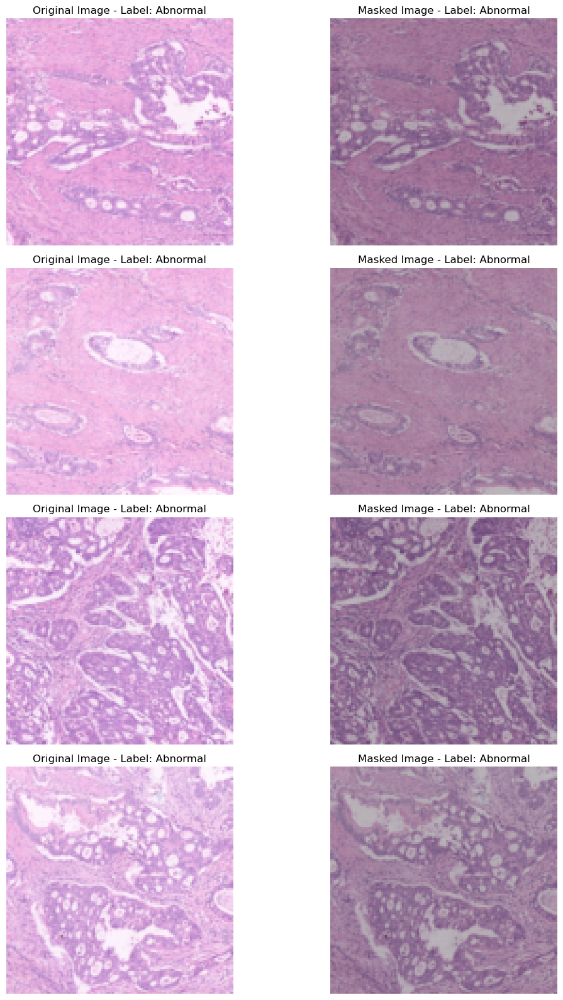


Epoch 6/20
------------------------------
Train Loss: 0.0985 Acc: 0.9857
Val Loss: 0.0963 Acc: 0.9929

Epoch 7/20
------------------------------
Train Loss: 0.1086 Acc: 0.9857
Val Loss: 0.1338 Acc: 0.9929

Epoch 8/20
------------------------------
Train Loss: 0.1077 Acc: 0.9929
Val Loss: 0.0946 Acc: 0.9929

Epoch 9/20
------------------------------
Train Loss: 0.1176 Acc: 0.9714
Val Loss: 0.1124 Acc: 0.9929

Epoch 10/20
------------------------------
Train Loss: 0.0952 Acc: 1.0000
Val Loss: 0.1078 Acc: 0.9929
Visualizing masked images from validation set:


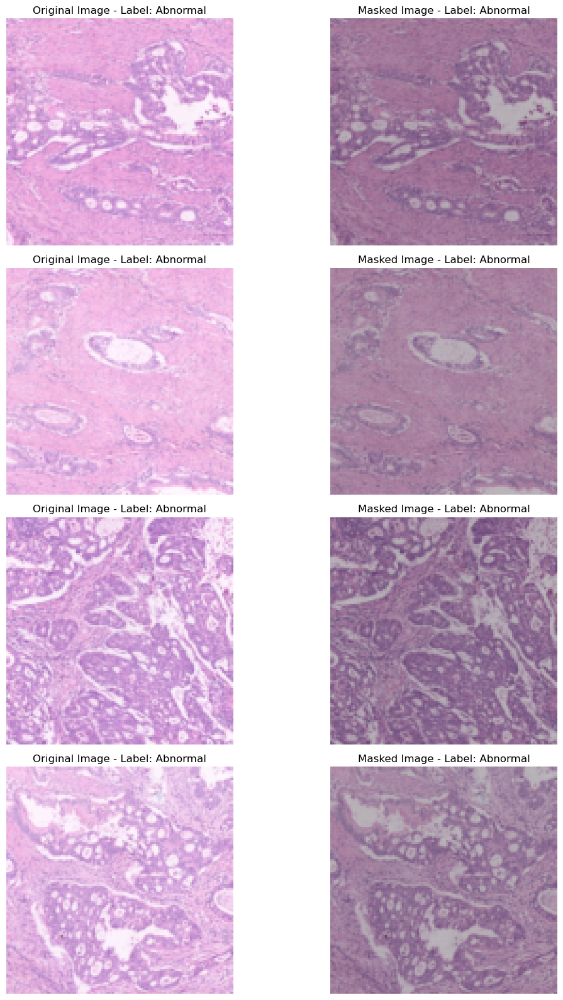


Epoch 11/20
------------------------------
Train Loss: 0.1155 Acc: 0.9786
Val Loss: 0.0841 Acc: 1.0000

Epoch 12/20
------------------------------
Train Loss: 0.1028 Acc: 0.9857
Val Loss: 0.0838 Acc: 1.0000

Epoch 13/20
------------------------------
Train Loss: 0.0945 Acc: 0.9857
Val Loss: 0.0744 Acc: 1.0000

Epoch 14/20
------------------------------
Train Loss: 0.0904 Acc: 0.9857
Val Loss: 0.0769 Acc: 1.0000

Epoch 15/20
------------------------------
Train Loss: 0.0908 Acc: 0.9857
Val Loss: 0.0897 Acc: 1.0000
Visualizing masked images from validation set:


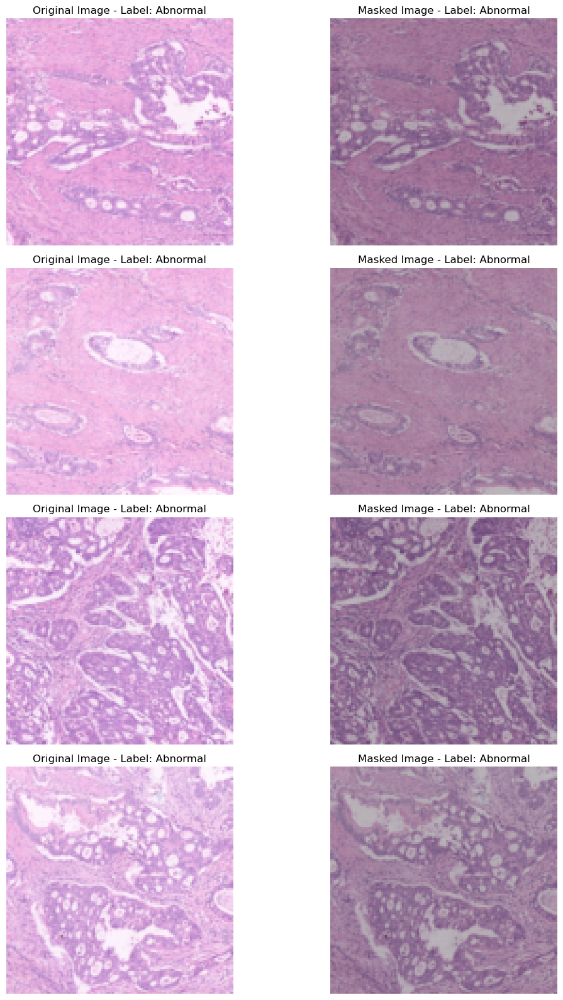


Epoch 16/20
------------------------------
Train Loss: 0.0763 Acc: 1.0000
Val Loss: 0.0952 Acc: 1.0000

Epoch 17/20
------------------------------
Train Loss: 0.0783 Acc: 1.0000
Val Loss: 0.0907 Acc: 1.0000

Epoch 18/20
------------------------------
Train Loss: 0.0725 Acc: 1.0000
Val Loss: 0.0854 Acc: 1.0000

Epoch 19/20
------------------------------
Train Loss: 0.0742 Acc: 1.0000
Val Loss: 0.0722 Acc: 1.0000

Epoch 20/20
------------------------------
Train Loss: 0.0751 Acc: 1.0000
Val Loss: 0.0843 Acc: 1.0000
Visualizing masked images from validation set:


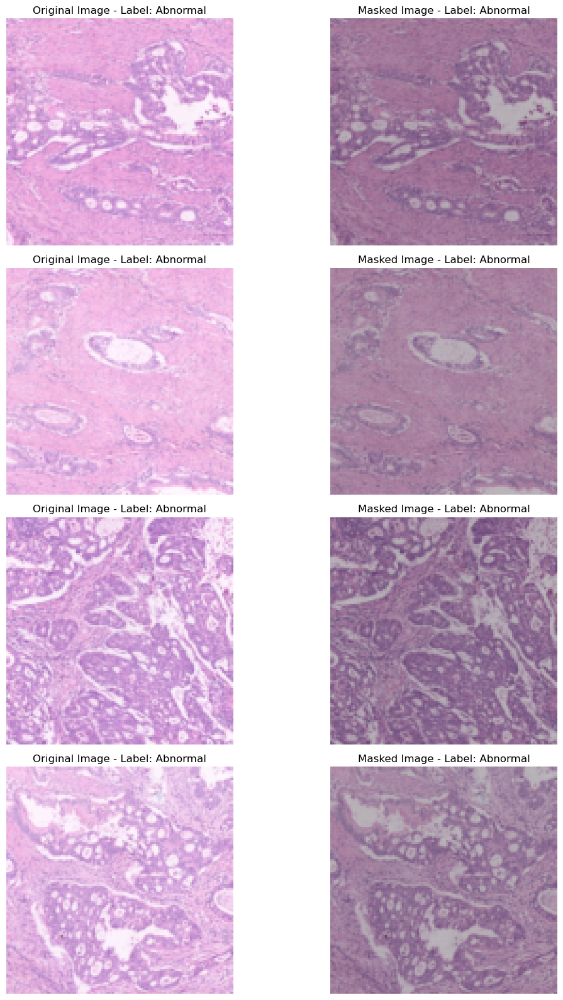


Masked classifier training completed and model saved.


In [20]:
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# === Initialize history ===
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': []
}

# === Function to visualize masked images ===
def visualize_masked_images(imgs, masks, labels, class_names=['Normal', 'Abnormal'], num_samples=5):
    imgs = imgs.cpu().permute(0, 2, 3, 1).numpy()  # (B, H, W, C)
    masks = masks.cpu().permute(0, 2, 3, 1).numpy()

    num_samples = min(num_samples, imgs.shape[0])  # <-- fix: make sure it doesn't exceed available images

    plt.figure(figsize=(12, num_samples * 4))

    for i in range(num_samples):
        # Original Image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(np.clip(imgs[i], 0, 1))
        plt.title(f"Original Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

        # Masked Image
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(np.clip(imgs[i] * masks[i], 0, 1))
        plt.title(f"Masked Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    
# === Training masked classifier ===
num_epochs_cls = 20

for epoch in range(num_epochs_cls):
    print(f"\nEpoch {epoch+1}/{num_epochs_cls}")
    print('-' * 30)
    
    for phase in ['train', 'val']:
        if phase == 'train':
            classifier.train()
            dataloader = train_loader
        else:
            classifier.eval()
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0
        total_samples = 0

        # all_preds = []
        # all_labels = []

        for imgs, img_paths in dataloader:
            imgs = imgs.to(device)

            # Extract labels from file path
            labels = []
            for path in img_paths:
                if 'non_cancer' in path.lower() or 'normal' in path.lower():
                    labels.append(0)
                else:
                    labels.append(1)
            labels = torch.tensor(labels, dtype=torch.long).to(device)
        
            # Generate masks from UNet
            with torch.no_grad():
                masks = torch.sigmoid(unet(imgs))  # Soft masks (sigmoid), Output shape: [batch, 1, H, W]
                # masks = (masks > 0.5).float()      # can threshold to binary masks but not used here 

            # Apply masks to images
            masked_imgs = imgs * masks  # Elementwise multiplication

            # Forward pass through classifier 
            outputs = classifier(masked_imgs)
            loss = criterion_cls(outputs, labels)

            # Backward and optimize
            if phase == 'train':
                optimizer_cls.zero_grad()
                loss.backward()
                optimizer_cls.step()

            preds = outputs.argmax(dim=1)

            running_loss += loss.item() * imgs.size(0)
            running_corrects += (preds == labels).sum().item()
            total_samples += labels.size(0)

            # all_preds.extend(outputs.softmax(dim=1)[:,1].detach().cpu().numpy())  # Probability of class 1
            # all_labels.extend(labels.detach().cpu().numpy())

        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects / total_samples
        #try:
        #    epoch_auc = roc_auc_score(all_labels, all_preds)
        #except ValueError:
        #    epoch_auc = float('nan')

        print(f"{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")
        history[f'{phase}_loss'].append(epoch_loss)
        history[f'{phase}_acc'].append(epoch_acc)

        # === Visualize a batch during validation ===
        # Every 5 epochs, during validation, it will show a few masked images to make sure UNet masking looks reasonable.
        if phase == 'val' and (epoch+1) % 5 == 0:  # Every 5 epochs
            print("Visualizing masked images from validation set:")
            imgs_cpu = imgs[:5].cpu()
            masks_cpu = masks[:5].cpu()
            labels_cpu = labels[:5].cpu().numpy()
            visualize_masked_images(imgs_cpu, masks_cpu, labels_cpu)

# === Save the classifier after training ===
torch.save(classifier.state_dict(), "./classifier_masked_trained.pth")
print("\nMasked classifier training completed and model saved.")

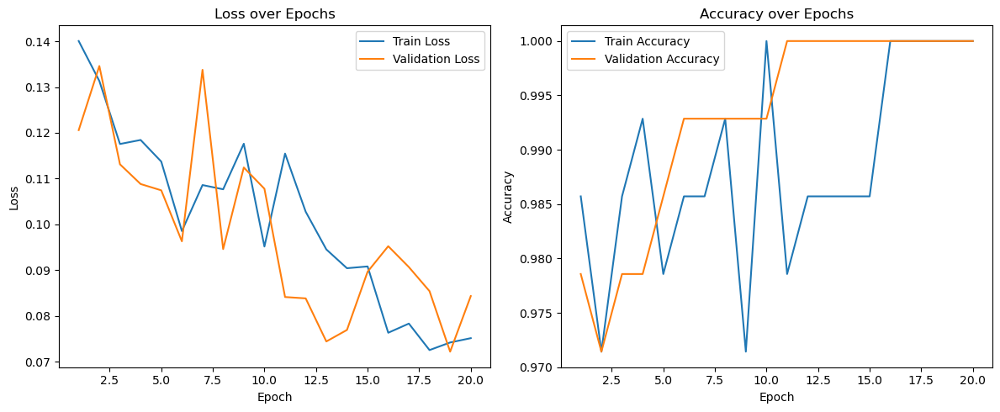

In [21]:
# === Plot Loss and Accuracy ===
import matplotlib.pyplot as plt

epochs = range(1, num_epochs_cls+1)

plt.figure(figsize=(12, 5))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_loss'], label='Train Loss')
plt.plot(epochs, history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_acc'], label='Train Accuracy')
plt.plot(epochs, history['val_acc'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

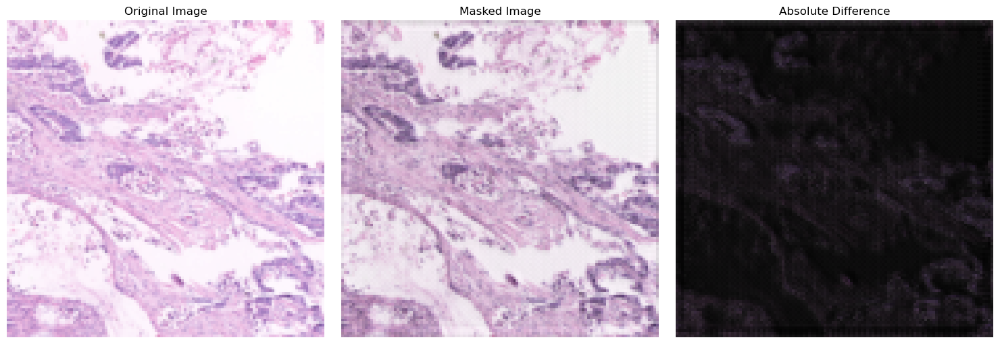

In [73]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Suppose you already have:
# - img_tensor: original input image tensor (1, 3, 120, 120) normalized
# - pred_mask: predicted U-Net mask (1, 1, 120, 120)

# First, unnormalize the img_tensor for visualization
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(img_tensor.device)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(img_tensor.device)
img_tensor_unnorm = img_tensor * std + mean  # (1, 3, 120, 120)

# Expand mask to 3 channels
pred_mask_expanded = pred_mask.repeat(1, 3, 1, 1)

# Masked image
masked_img = img_tensor_unnorm * pred_mask_expanded  # (1, 3, 120, 120)

# Calculate absolute difference
difference = torch.abs(img_tensor_unnorm - masked_img)  # (1, 3, 120, 120)
difference = difference.squeeze(0).permute(1,2,0).cpu().numpy()  # (120, 120, 3)

# Visualize
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(img_tensor_unnorm.squeeze(0).permute(1,2,0).cpu().numpy())
axs[0].set_title("Original Image")
axs[0].axis('off')

# Masked image
axs[1].imshow(masked_img.squeeze(0).permute(1,2,0).cpu().numpy())
axs[1].set_title("Masked Image")
axs[1].axis('off')

# Difference heatmap
axs[2].imshow(difference)
axs[2].set_title("Absolute Difference")
axs[2].axis('off')

plt.tight_layout()
plt.show()

Predicted Class: 1


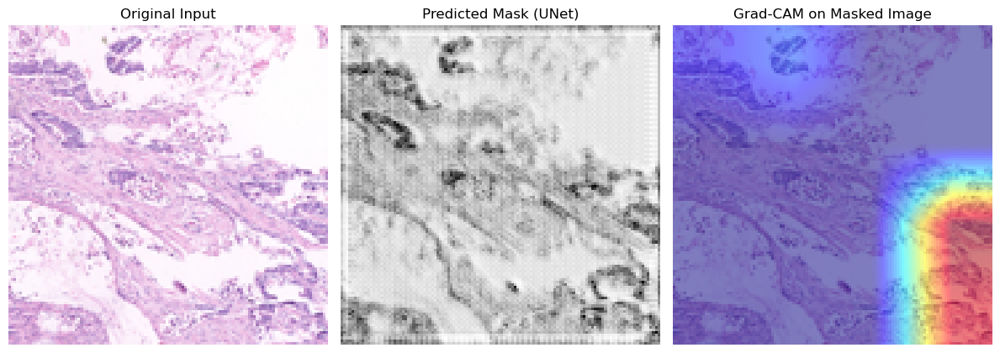

In [72]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ====== Load your trained UNet ====== #
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

# ====== Load your trained Classifier ====== #
classifier = create_gradual_fc_resnet_model(num_classes=2).to(device)
classifier.load_state_dict(torch.load("/gpfs/scratch/hz3106/Gashisdb/models/gradual_fc_gastric_cnn_resnet.pth"))
classifier.eval()

# ====== Define Image Transform ====== #
img_size = 120
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                         std=[0.229, 0.224, 0.225])
])

# ====== Load a Test Image ====== #
img_path = "/gpfs/scratch/hz3106/Gashisdb/cancer_Sub_Ori_test1/2017-06-09_18.08.16.ndpi.16.14788_15256.2048x2048.png"  # Change to your test image path
original_img = Image.open(img_path).convert('RGB')
img_for_display = np.array(original_img.resize((img_size, img_size))) / 255.0  # for plotting later
img_tensor = transform(original_img).unsqueeze(0).to(device)  # (1,3,120,120)

# ====== Predict Mask with UNet ====== #
with torch.no_grad():
    pred_mask = torch.sigmoid(unet(img_tensor))  # (1,1,120,120)

# ====== Apply Mask to Input ====== #
pred_mask_expanded = pred_mask.repeat(1, 3, 1, 1)  # Expand to (1,3,120,120)
masked_img = img_tensor * pred_mask_expanded  # Element-wise multiply

# ====== Predict with Classifier ====== #
outputs = classifier(masked_img)
predicted_class = torch.argmax(outputs, dim=1).item()
print(f"Predicted Class: {predicted_class}")

# ====== Apply Grad-CAM on Masked Image ====== #
target_layers = [classifier.layer4[-1]]  # GradCAM on ResNet layer4
cam = GradCAM(model=classifier, target_layers=target_layers)

grayscale_cam = cam(input_tensor=masked_img, targets=[ClassifierOutputTarget(predicted_class)])[0]
visualization = show_cam_on_image(img_for_display, grayscale_cam, use_rgb=True)

# ====== Plot ====== #
plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
plt.imshow(img_for_display)
plt.title("Original Input")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(pred_mask[0,0].cpu(), cmap='gray')
plt.title("Predicted Mask (UNet)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(visualization)
plt.title("Grad-CAM on Masked Image")
plt.axis("off")

plt.tight_layout()
plt.show()


Epoch 1/20
------------------------------
Train Loss: 0.2456 Acc: 0.9143
Val Loss: 0.2187 Acc: 0.9857

Epoch 2/20
------------------------------
Train Loss: 0.2173 Acc: 0.9429
Val Loss: 0.2242 Acc: 0.9071

Epoch 3/20
------------------------------
Train Loss: 0.1959 Acc: 0.9500
Val Loss: 0.1542 Acc: 0.9500

Epoch 4/20
------------------------------
Train Loss: 0.1820 Acc: 0.9429
Val Loss: 0.1730 Acc: 0.9357

Epoch 5/20
------------------------------
Train Loss: 0.1550 Acc: 0.9571
Val Loss: 0.1373 Acc: 0.9500
Visualizing masked images from validation set:


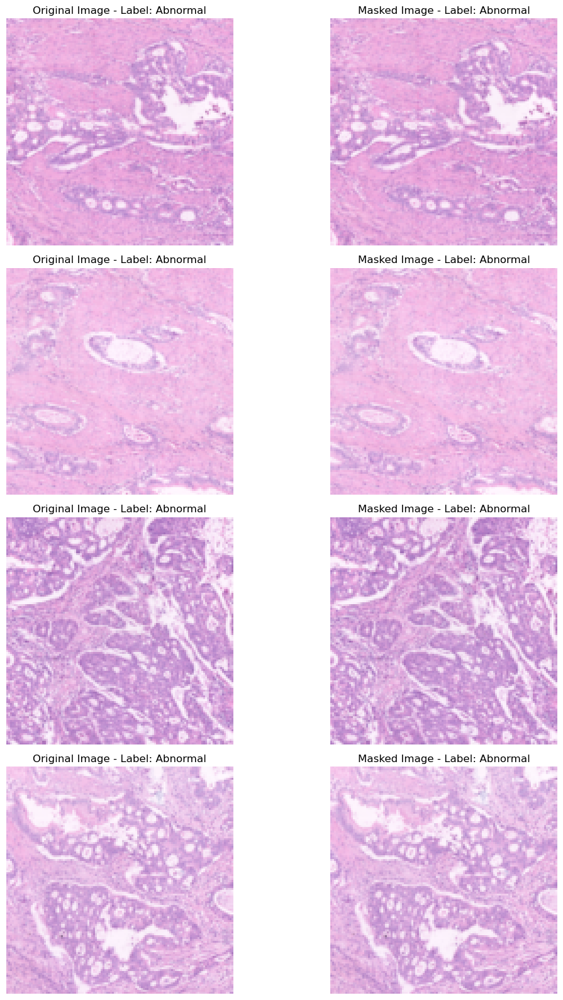


Epoch 6/20
------------------------------
Train Loss: 0.1612 Acc: 0.9714
Val Loss: 0.1170 Acc: 0.9786

Epoch 7/20
------------------------------
Train Loss: 0.1387 Acc: 0.9643
Val Loss: 0.1301 Acc: 0.9643

Epoch 8/20
------------------------------
Train Loss: 0.1143 Acc: 0.9857
Val Loss: 0.1134 Acc: 0.9857

Epoch 9/20
------------------------------
Train Loss: 0.1295 Acc: 0.9786
Val Loss: 0.1358 Acc: 0.9786

Epoch 10/20
------------------------------
Train Loss: 0.1233 Acc: 0.9786
Val Loss: 0.1356 Acc: 0.9786
Visualizing masked images from validation set:


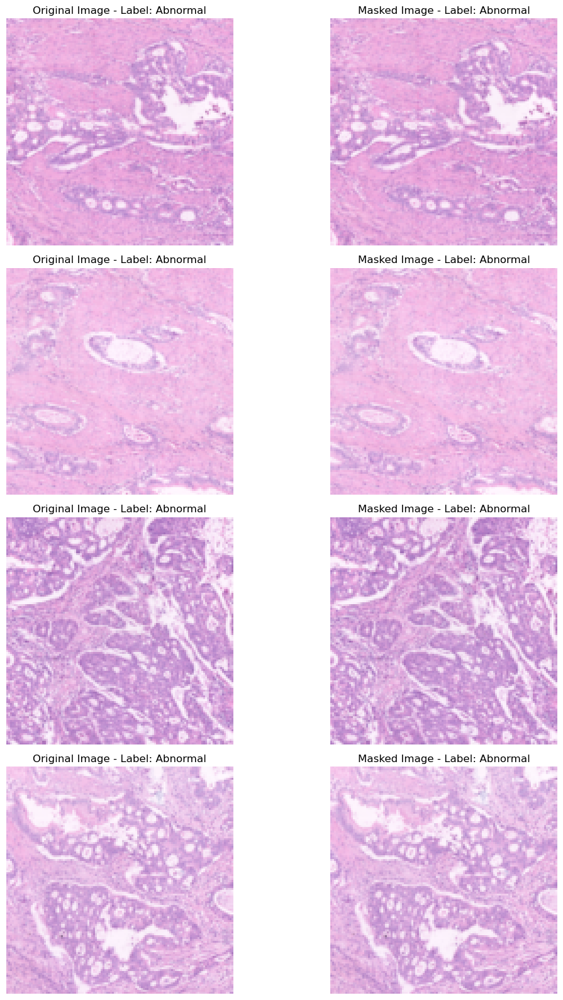


Epoch 11/20
------------------------------
Train Loss: 0.1403 Acc: 0.9786
Val Loss: 0.1109 Acc: 0.9857

Epoch 12/20
------------------------------
Train Loss: 0.1150 Acc: 0.9857
Val Loss: 0.1245 Acc: 0.9929

Epoch 13/20
------------------------------
Train Loss: 0.1120 Acc: 0.9929
Val Loss: 0.1033 Acc: 0.9929

Epoch 14/20
------------------------------
Train Loss: 0.1121 Acc: 0.9857
Val Loss: 0.1075 Acc: 1.0000

Epoch 15/20
------------------------------
Train Loss: 0.1035 Acc: 0.9929
Val Loss: 0.1044 Acc: 0.9929
Visualizing masked images from validation set:


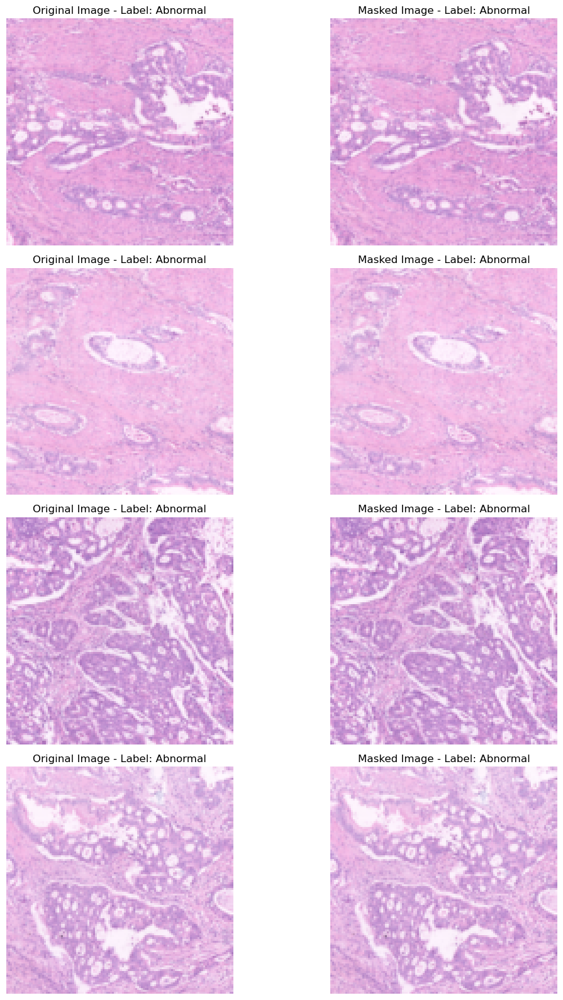


Epoch 16/20
------------------------------
Train Loss: 0.0989 Acc: 0.9929
Val Loss: 0.1012 Acc: 1.0000

Epoch 17/20
------------------------------
Train Loss: 0.0869 Acc: 1.0000
Val Loss: 0.1117 Acc: 1.0000

Epoch 18/20
------------------------------
Train Loss: 0.0855 Acc: 1.0000
Val Loss: 0.0953 Acc: 1.0000

Epoch 19/20
------------------------------
Train Loss: 0.0989 Acc: 0.9929
Val Loss: 0.0997 Acc: 1.0000

Epoch 20/20
------------------------------
Train Loss: 0.0928 Acc: 0.9929
Val Loss: 0.0797 Acc: 1.0000
Visualizing masked images from validation set:


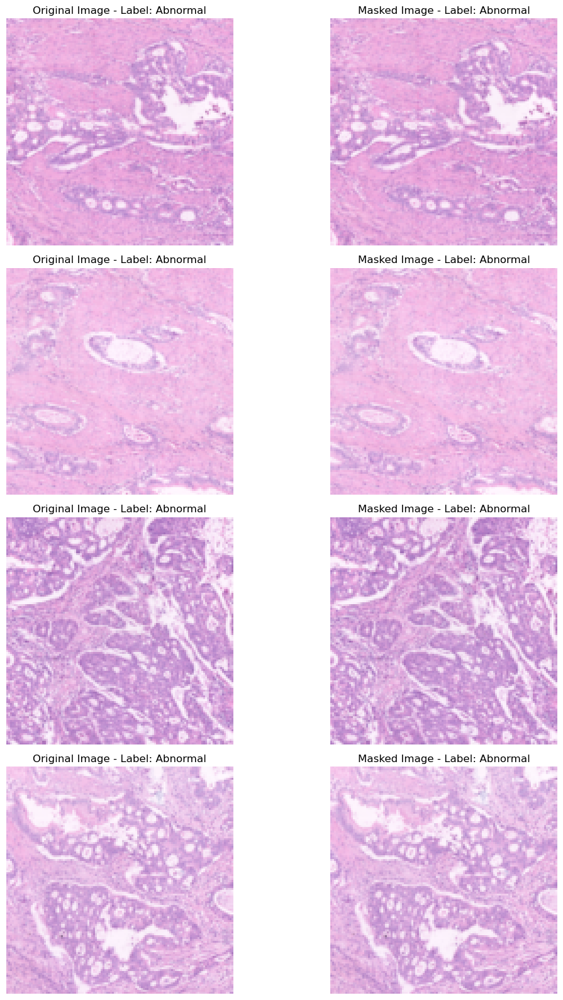


Masked classifier training completed and model saved.


In [33]:
######## Classifiers with Binary threshold 0.5
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# === Initialize history ===
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': []
}

# === Function to visualize masked images ===
def visualize_masked_images(imgs, masks, labels, class_names=['Normal', 'Abnormal'], num_samples=5):
    imgs = imgs.cpu().permute(0, 2, 3, 1).numpy()  # (B, H, W, C)
    masks = masks.cpu().permute(0, 2, 3, 1).numpy()

    num_samples = min(num_samples, imgs.shape[0])  # <-- fix: make sure it doesn't exceed available images

    plt.figure(figsize=(12, num_samples * 4))

    for i in range(num_samples):
        # Original Image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(np.clip(imgs[i], 0, 1))
        plt.title(f"Original Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

        # Masked Image
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(np.clip(imgs[i] * masks[i], 0, 1))
        plt.title(f"Masked Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    
# === Training masked classifier ===
num_epochs_cls = 20

for epoch in range(num_epochs_cls):
    print(f"\nEpoch {epoch+1}/{num_epochs_cls}")
    print('-' * 30)
    
    for phase in ['train', 'val']:
        if phase == 'train':
            classifier.train()
            dataloader = train_loader
        else:
            classifier.eval()
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0
        total_samples = 0

        # all_preds = []
        # all_labels = []

        for imgs, img_paths in dataloader:
            imgs = imgs.to(device)

            # Extract labels from file path
            labels = []
            for path in img_paths:
                if 'non_cancer' in path.lower() or 'normal' in path.lower():
                    labels.append(0)
                else:
                    labels.append(1)
            labels = torch.tensor(labels, dtype=torch.long).to(device)
        
            # Generate masks from UNet
            with torch.no_grad():
                masks = torch.sigmoid(unet(imgs))  # Soft masks (sigmoid), Output shape: [batch, 1, H, W]
                masks = (masks > 0.5).float()      # can threshold to binary masks but not used here 

            # Apply masks to images
            masked_imgs = imgs * masks  # Elementwise multiplication

            # Forward pass through classifier 
            outputs = classifier(masked_imgs)
            loss = criterion_cls(outputs, labels)

            # Backward and optimize
            if phase == 'train':
                optimizer_cls.zero_grad()
                loss.backward()
                optimizer_cls.step()

            preds = outputs.argmax(dim=1)

            running_loss += loss.item() * imgs.size(0)
            running_corrects += (preds == labels).sum().item()
            total_samples += labels.size(0)

            # all_preds.extend(outputs.softmax(dim=1)[:,1].detach().cpu().numpy())  # Probability of class 1
            # all_labels.extend(labels.detach().cpu().numpy())

        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects / total_samples
        #try:
        #    epoch_auc = roc_auc_score(all_labels, all_preds)
        #except ValueError:
        #    epoch_auc = float('nan')

        print(f"{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")
        history[f'{phase}_loss'].append(epoch_loss)
        history[f'{phase}_acc'].append(epoch_acc)

        # === Visualize a batch during validation ===
        # Every 5 epochs, during validation, it will show a few masked images to make sure UNet masking looks reasonable.
        if phase == 'val' and (epoch+1) % 5 == 0:  # Every 5 epochs
            print("Visualizing masked images from validation set:")
            imgs_cpu = imgs[:5].cpu()
            masks_cpu = masks[:5].cpu()
            labels_cpu = labels[:5].cpu().numpy()
            visualize_masked_images(imgs_cpu, masks_cpu, labels_cpu)

# === Save the classifier after training ===
torch.save(classifier.state_dict(), "./classifier_masked_trained_binary.pth")
print("\nMasked classifier training completed and model saved.")

In [34]:
def evaluate_classifier_on_test_set(unet, classifier, test_loader, criterion_cls):
    classifier.eval()
    unet.eval()

    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    for imgs, img_paths in test_loader:
        imgs = imgs.to(device)

        # Create binary labels
        labels = []
        for path in img_paths:
            if 'non_cancer' in path.lower() or 'normal' in path.lower():
                labels.append(0)
            else:
                labels.append(1)
        labels = torch.tensor(labels, dtype=torch.long).to(device)

        with torch.no_grad():
            masks = torch.sigmoid(unet(imgs))  # [B, 1, H, W]
            masks = (masks > 0.5).float()      # keep this thresholding for now

            masked_imgs = imgs * masks

            outputs = classifier(masked_imgs)
            loss = criterion_cls(outputs, labels)

        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * imgs.size(0)
        running_corrects += (preds == labels).sum().item()
        total_samples += labels.size(0)

    test_loss = running_loss / total_samples
    test_acc = running_corrects / total_samples
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

In [35]:
evaluate_classifier_on_test_set(unet, classifier, test_loader, criterion_cls)

Test Loss: 0.0719, Test Accuracy: 0.9964


In [22]:
# === Evaluate on test set ===
classifier.eval()
running_loss = 0.0
running_corrects = 0
total_samples = 0

for imgs, img_paths in test_loader:
    imgs = imgs.to(device)

    # Extract labels
    labels = []
    for path in img_paths:
        if 'non_cancer' in path.lower() or 'normal' in path.lower():
            labels.append(0)
        else:
            labels.append(1)
    labels = torch.tensor(labels, dtype=torch.long).to(device)

    # Generate soft masks
    with torch.no_grad():
        masks = torch.sigmoid(unet(imgs))
        masked_imgs = imgs * masks

    outputs = classifier(masked_imgs)
    preds = outputs.argmax(dim=1)

    loss = criterion_cls(outputs, labels)

    running_loss += loss.item() * imgs.size(0)
    running_corrects += (preds == labels).sum().item()
    total_samples += labels.size(0)

test_loss = running_loss / total_samples
test_acc = running_corrects / total_samples

print(f"\nTest Loss: {test_loss:.4f} | Test Accuracy: {test_acc:.4f}")


Test Loss: 0.0778 | Test Accuracy: 1.0000



Epoch 1/20
------------------------------
Train Loss: 0.0811 Acc: 0.9857
Val   Loss: 0.0752 Acc: 1.0000

Epoch 2/20
------------------------------
Train Loss: 0.0676 Acc: 1.0000
Val   Loss: 0.0928 Acc: 1.0000

Epoch 3/20
------------------------------
Train Loss: 0.0627 Acc: 1.0000
Val   Loss: 0.0751 Acc: 1.0000

Epoch 4/20
------------------------------
Train Loss: 0.0653 Acc: 1.0000
Val   Loss: 0.0787 Acc: 1.0000

Epoch 5/20
------------------------------
Train Loss: 0.0619 Acc: 1.0000
Val   Loss: 0.0764 Acc: 1.0000
Visualizing masked images from validation set:


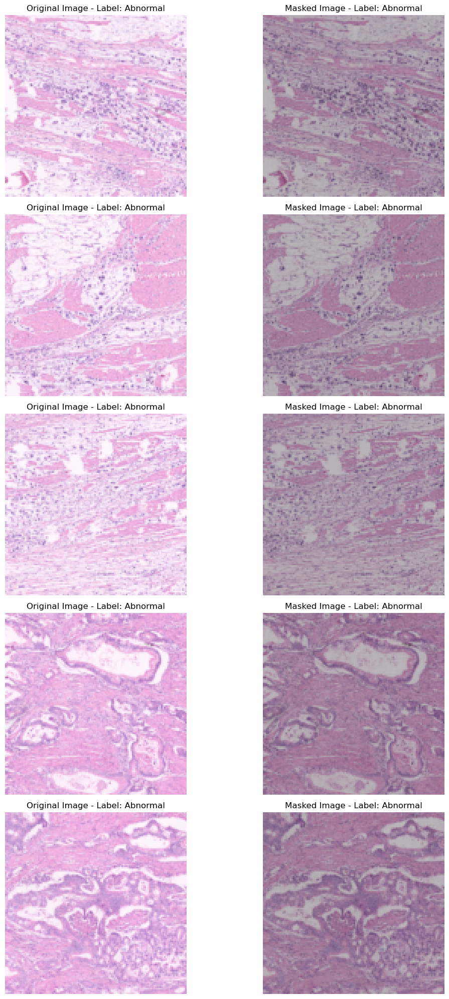


Epoch 6/20
------------------------------
Train Loss: 0.0598 Acc: 0.9929
Val   Loss: 0.0947 Acc: 1.0000

Epoch 7/20
------------------------------
Train Loss: 0.0555 Acc: 1.0000
Val   Loss: 0.0745 Acc: 1.0000

Epoch 8/20
------------------------------
Train Loss: 0.0507 Acc: 1.0000
Val   Loss: 0.0788 Acc: 1.0000

Epoch 9/20
------------------------------
Train Loss: 0.0507 Acc: 1.0000
Val   Loss: 0.0587 Acc: 1.0000

Epoch 10/20
------------------------------
Train Loss: 0.0624 Acc: 0.9929
Val   Loss: 0.0561 Acc: 1.0000
Visualizing masked images from validation set:


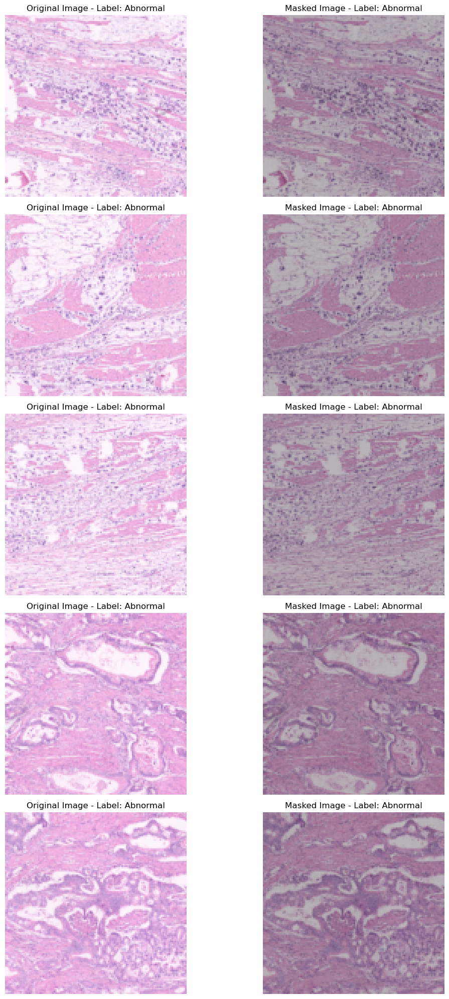


Epoch 11/20
------------------------------
Train Loss: 0.0469 Acc: 1.0000
Val   Loss: 0.0548 Acc: 1.0000

Epoch 12/20
------------------------------
Train Loss: 0.0453 Acc: 1.0000
Val   Loss: 0.0531 Acc: 1.0000

Epoch 13/20
------------------------------
Train Loss: 0.0382 Acc: 1.0000
Val   Loss: 0.0593 Acc: 1.0000

Epoch 14/20
------------------------------
Train Loss: 0.0436 Acc: 1.0000
Val   Loss: 0.0576 Acc: 1.0000

Epoch 15/20
------------------------------
Train Loss: 0.0468 Acc: 0.9929
Val   Loss: 0.0450 Acc: 1.0000
Visualizing masked images from validation set:


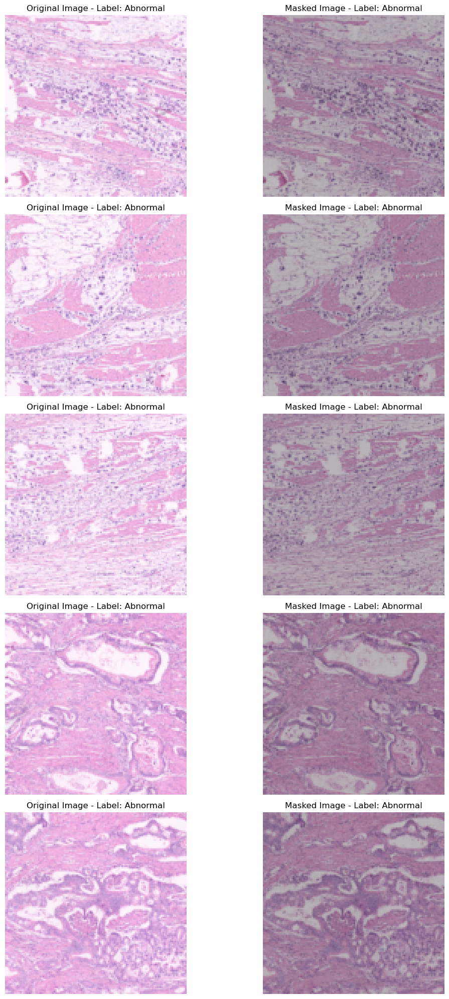


Epoch 16/20
------------------------------
Train Loss: 0.0418 Acc: 1.0000
Val   Loss: 0.0409 Acc: 1.0000

Epoch 17/20
------------------------------
Train Loss: 0.0462 Acc: 0.9929
Val   Loss: 0.0659 Acc: 1.0000

Epoch 18/20
------------------------------
Train Loss: 0.0362 Acc: 1.0000
Val   Loss: 0.0641 Acc: 1.0000

Epoch 19/20
------------------------------
Train Loss: 0.0370 Acc: 1.0000
Val   Loss: 0.0461 Acc: 1.0000

Epoch 20/20
------------------------------
Train Loss: 0.0375 Acc: 0.9929
Val   Loss: 0.0422 Acc: 1.0000
Visualizing masked images from validation set:


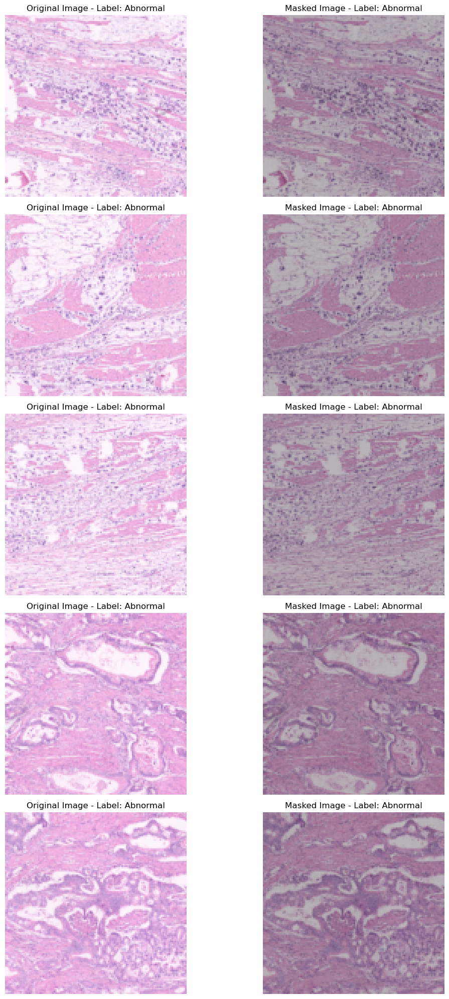


Masked classifier training completed and model saved.


In [23]:
# Classifier with 2 different functions for training and validation 
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

# === Initialize history ===
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': []
}

# === Function to visualize masked images ===
def visualize_masked_images(imgs, masks, labels, class_names=['Normal', 'Abnormal'], num_samples=5):
    imgs = imgs.cpu().permute(0, 2, 3, 1).numpy()  # (B, H, W, C)
    masks = masks.cpu().permute(0, 2, 3, 1).numpy()

    num_samples = min(num_samples, imgs.shape[0])

    plt.figure(figsize=(12, num_samples * 4))
    for i in range(num_samples):
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(np.clip(imgs[i], 0, 1))
        plt.title(f"Original Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(np.clip(imgs[i] * masks[i], 0, 1))
        plt.title(f"Masked Image - Label: {class_names[labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# === Function to train for one epoch ===
def train_one_epoch(classifier, unet, train_loader, criterion_cls, optimizer_cls, device):
    classifier.train()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    for imgs, img_paths in train_loader:
        imgs = imgs.to(device)

        # Extract labels from file path
        labels = []
        for path in img_paths:
            if 'non_cancer' in path.lower() or 'normal' in path.lower():
                labels.append(0)
            else:
                labels.append(1)
        labels = torch.tensor(labels, dtype=torch.long).to(device)

        # Generate masks
        with torch.no_grad():
            masks = torch.sigmoid(unet(imgs))

        masked_imgs = imgs * masks

        outputs = classifier(masked_imgs)
        loss = criterion_cls(outputs, labels)

        optimizer_cls.zero_grad()
        loss.backward()
        optimizer_cls.step()

        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * imgs.size(0)
        running_corrects += (preds == labels).sum().item()
        total_samples += labels.size(0)

    epoch_loss = running_loss / total_samples
    epoch_acc = running_corrects / total_samples

    return epoch_loss, epoch_acc

# === Function to validate for one epoch ===
def validate_one_epoch(classifier, unet, val_loader, criterion_cls, device):
    classifier.eval()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    with torch.no_grad():
        for imgs, img_paths in val_loader:
            imgs = imgs.to(device)

            # Extract labels from file path
            labels = []
            for path in img_paths:
                if 'non_cancer' in path.lower() or 'normal' in path.lower():
                    labels.append(0)
                else:
                    labels.append(1)
            labels = torch.tensor(labels, dtype=torch.long).to(device)

            masks = torch.sigmoid(unet(imgs))
            masked_imgs = imgs * masks

            outputs = classifier(masked_imgs)
            loss = criterion_cls(outputs, labels)

            preds = outputs.argmax(dim=1)
            running_loss += loss.item() * imgs.size(0)
            running_corrects += (preds == labels).sum().item()
            total_samples += labels.size(0)

    epoch_loss = running_loss / total_samples
    epoch_acc = running_corrects / total_samples

    return epoch_loss, epoch_acc

# === Main training loop ===
num_epochs_cls = 20

for epoch in range(num_epochs_cls):
    print(f"\nEpoch {epoch+1}/{num_epochs_cls}")
    print('-' * 30)

    train_loss, train_acc = train_one_epoch(classifier, unet, train_loader, criterion_cls, optimizer_cls, device)
    val_loss, val_acc = validate_one_epoch(classifier, unet, val_loader, criterion_cls, device)

    print(f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    if (epoch + 1) % 5 == 0:
        print("Visualizing masked images from validation set:")
        imgs_cpu = imgs[:5].cpu()
        masks_cpu = masks[:5].cpu()
        labels_cpu = labels[:5].cpu().numpy()
        visualize_masked_images(imgs_cpu, masks_cpu, labels_cpu)

# === Save the trained classifier ===
torch.save(classifier.state_dict(), "./classifier_masked_trained.pth")
print("\nMasked classifier training completed and model saved.")

In [24]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.get_device_name(torch.cuda.current_device()))

True
0
NVIDIA A100 80GB PCIe



Epoch 1/20
------------------------------
Train Loss: 0.6953 Acc: 0.5286
Val Loss: 0.5474 Acc: 1.0000

Epoch 2/20
------------------------------
Train Loss: 0.6816 Acc: 0.6000
Val Loss: 0.5178 Acc: 1.0000

Epoch 3/20
------------------------------
Train Loss: 0.6649 Acc: 0.5571
Val Loss: 0.4779 Acc: 1.0000

Epoch 4/20
------------------------------
Train Loss: 0.6384 Acc: 0.6286
Val Loss: 0.4564 Acc: 1.0000

Epoch 5/20
------------------------------
Train Loss: 0.6162 Acc: 0.6714
Val Loss: 0.4443 Acc: 1.0000

Epoch 6/20
------------------------------
Train Loss: 0.5764 Acc: 0.7143
Val Loss: 0.4574 Acc: 1.0000

Epoch 7/20
------------------------------
Train Loss: 0.5579 Acc: 0.7286
Val Loss: 0.4928 Acc: 1.0000

Epoch 8/20
------------------------------
Train Loss: 0.5489 Acc: 0.7786
Val Loss: 0.4621 Acc: 1.0000

Epoch 9/20
------------------------------
Train Loss: 0.5205 Acc: 0.8000
Val Loss: 0.4327 Acc: 1.0000

Epoch 10/20
------------------------------
Train Loss: 0.5010 Acc: 0.828

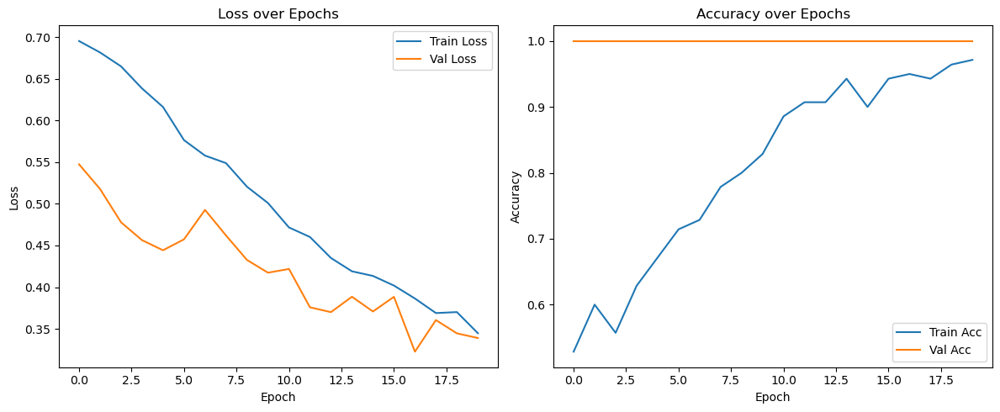

In [74]:
# Unet with 0.7 threshold, CrossEntropy weights, no visualization of images in between 
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import matplotlib.pyplot as plt
import numpy as np

# ----- Device Setup -----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----- Load Pretrained U-Net -----
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()  # Freeze U-Net

# ----- Define Classifier -----
class GradualFCGastricCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(GradualFCGastricCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU(inplace=True)
        self.pool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.relu2 = nn.ReLU(inplace=True)
        self.pool2 = nn.MaxPool2d(2)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.relu3 = nn.ReLU(inplace=True)
        self.pool3 = nn.MaxPool2d(2)
        self.conv4 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.relu4 = nn.ReLU(inplace=True)
        self.pool4 = nn.MaxPool2d(2)
        self.fc_layers = nn.Sequential(
            nn.Linear(256*7*7, 4096), nn.BatchNorm1d(4096), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(4096, 2048), nn.BatchNorm1d(2048), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(2048, 1024), nn.BatchNorm1d(1024), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(1024, 512), nn.BatchNorm1d(512), nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(512, 256), nn.BatchNorm1d(256), nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(256, 128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(128, 64), nn.BatchNorm1d(64), nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(32, num_classes)
        )

    def forward(self, x):
        x = self.pool1(self.relu1(self.bn1(self.conv1(x))))
        x = self.pool2(self.relu2(self.bn2(self.conv2(x))))
        x = self.pool3(self.relu3(self.bn3(self.conv3(x))))
        x = self.pool4(self.relu4(self.bn4(self.conv4(x))))
        x = x.view(x.size(0), -1)
        return self.fc_layers(x)

# ----- Load Classifier -----
classifier = GradualFCGastricCNN(num_classes=2).to(device)

# ----- Optimizer & Weighted Cross Entropy Loss -----
optimizer_cls = optim.Adam(classifier.parameters(), lr=1e-4)
criterion_cls = nn.CrossEntropyLoss(weight=class_weights.to(device))  # class_weights is assumed to be defined

# ----- Train Classifier Using U-Net Masks -----
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
num_epochs_cls = 20

for epoch in range(num_epochs_cls):
    print(f"\nEpoch {epoch+1}/{num_epochs_cls}")
    print('-' * 30)
    for phase in ['train', 'val']:
        classifier.train() if phase == 'train' else classifier.eval()
        dataloader = train_loader if phase == 'train' else val_loader

        running_loss = 0.0
        running_corrects = 0
        total_samples = 0

        for imgs, img_paths in dataloader:
            imgs = imgs.to(device)
            labels = [0 if 'normal' in p.lower() else 1 for p in img_paths]
            labels = torch.tensor(labels, dtype=torch.long).to(device)

            with torch.no_grad():
                masks = torch.sigmoid(unet(imgs))
                masks = (masks > 0.7).float()  # ** Binary threshold at 0.7

            masked_imgs = imgs * masks  # elementwise multiplication

            outputs = classifier(masked_imgs)
            loss = criterion_cls(outputs, labels)

            if phase == 'train':
                optimizer_cls.zero_grad()
                loss.backward()
                optimizer_cls.step()

            preds = outputs.argmax(dim=1)
            running_loss += loss.item() * imgs.size(0)
            running_corrects += (preds == labels).sum().item()
            total_samples += labels.size(0)

        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects / total_samples
        print(f"{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")
        history[f'{phase}_loss'].append(epoch_loss)
        history[f'{phase}_acc'].append(epoch_acc)

# ----- Save Classifier -----
torch.save(classifier.state_dict(), "./classifier_binary0.7.pth")

# ----- Plot Curves -----
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title('Loss over Epochs'); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['train_acc'], label='Train Acc')
plt.plot(history['val_acc'], label='Val Acc')
plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.title('Accuracy over Epochs'); plt.legend()

plt.tight_layout()
plt.show()

## Threshold = 0.6


Epoch 1/20
------------------------------
Train Loss: 0.6809 Acc: 0.5643
Val   Loss: 0.6936 Acc: 0.2571

Epoch 2/20
------------------------------
Train Loss: 0.6475 Acc: 0.6214
Val   Loss: 0.6834 Acc: 0.7000

Epoch 3/20
------------------------------
Train Loss: 0.6355 Acc: 0.6500
Val   Loss: 0.6045 Acc: 1.0000

Epoch 4/20
------------------------------
Train Loss: 0.6114 Acc: 0.6714
Val   Loss: 0.6615 Acc: 0.7357

Epoch 5/20
------------------------------
Train Loss: 0.5705 Acc: 0.7214
Val   Loss: 0.6208 Acc: 0.9643

Epoch 6/20
------------------------------
Train Loss: 0.5563 Acc: 0.7071
Val   Loss: 0.6252 Acc: 0.9929

Epoch 7/20
------------------------------
Train Loss: 0.5451 Acc: 0.7643
Val   Loss: 0.6069 Acc: 1.0000

Epoch 8/20
------------------------------
Train Loss: 0.5144 Acc: 0.8286
Val   Loss: 0.5788 Acc: 0.9929

Epoch 9/20
------------------------------
Train Loss: 0.4934 Acc: 0.8357
Val   Loss: 0.6000 Acc: 1.0000

Epoch 10/20
------------------------------
Train Loss:

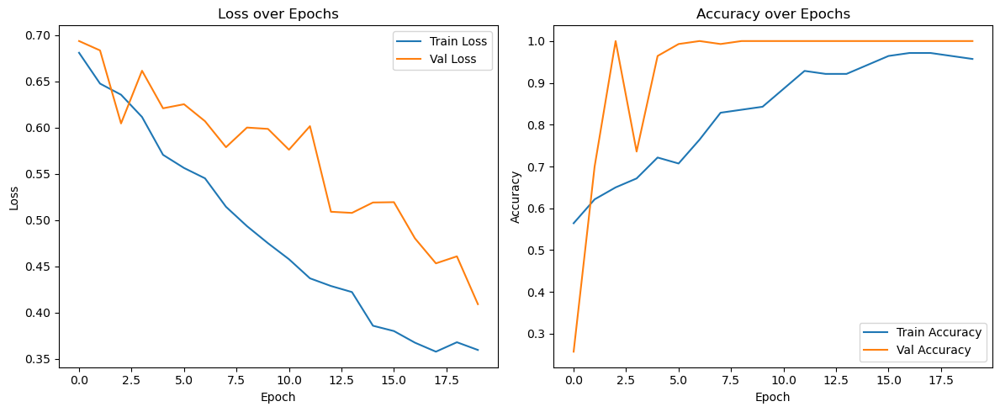

In [84]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

classifier = GradualFCGastricCNN(num_classes=2).to(device)
optimizer_cls = optim.Adam(classifier.parameters(), lr=1e-4)
criterion_cls = nn.CrossEntropyLoss(weight=class_weights.to(device))

# === History ===
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
num_epochs = 20
# mask_threshold = 0.5  # can set 0.5 or 0.7

# === Helper Function ===
def run_one_phase(phase_loader, phase, model, unet, threshold):
    model.train() if phase == 'train' else model.eval()
    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    for imgs, paths in phase_loader:
        imgs = imgs.to(device)

        # Labels from paths
        labels = torch.tensor([0 if 'normal' in p.lower() else 1 for p in paths], dtype=torch.long).to(device)

        with torch.no_grad():
            masks = torch.sigmoid(unet(imgs))
            masks = (masks > 0.6).float() # Binary thresholded mask

        masked_imgs = imgs * masks  # Apply mask

        with torch.set_grad_enabled(phase == 'train'):
            outputs = model(masked_imgs)
            loss = criterion_cls(outputs, labels)

            if phase == 'train':
                optimizer_cls.zero_grad()
                loss.backward()
                optimizer_cls.step()

        preds = outputs.argmax(dim=1)
        total_loss += loss.item() * imgs.size(0)
        total_correct += (preds == labels).sum().item()
        total_samples += labels.size(0)

    return total_loss / total_samples, total_correct / total_samples

# === Training Loop ===
for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print('-' * 30)

    train_loss, train_acc = run_one_phase(train_loader, 'train', classifier, unet, mask_threshold)
    val_loss, val_acc = run_one_phase(val_loader, 'val', classifier, unet, mask_threshold)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    print(f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

# === Plot Training History ===
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Loss over Epochs'); plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['train_acc'], label='Train Accuracy')
plt.plot(history['val_acc'], label='Val Accuracy')
plt.title('Accuracy over Epochs'); plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend()

plt.tight_layout()
plt.show()

In [85]:
# === Save the trained classifier ===
torch.save(classifier.state_dict(), "./classifier_binary0.6.pth")
print("Model saved to classifier_binary0.6.pth")

Model saved to classifier_binary0.6.pth


In [87]:
# --- Reload UNet and trained classifier ---
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

classifier = GradualFCGastricCNN(num_classes=2).to(device)
classifier.load_state_dict(torch.load("./classifier_binary0.6.pth"))
classifier.eval()

# --- Define threshold used in training ---
mask_threshold = 0.6

# --- Evaluate on test set ---
correct = 0
total = 0

with torch.no_grad():
    for imgs, paths in test_loader:
        imgs = imgs.to(device)

        # Infer labels from file names
        labels = [0 if 'normal' in p.lower() else 1 for p in paths]
        labels = torch.tensor(labels, dtype=torch.long).to(device)

        # Generate binary masks from UNet
        masks = torch.sigmoid(unet(imgs))
        masks = (masks > mask_threshold).float()

        # Apply masks and predict
        masked_imgs = imgs * masks
        outputs = classifier(masked_imgs)
        preds = outputs.argmax(dim=1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

test_accuracy = correct / total
print(f"\nTest Accuracy: {test_accuracy:.4f}")


Test Accuracy: 1.0000


In [ ]:
# Other metrics 
from sklearn.metrics import precision_score, recall_score, f1_score

all_preds = []
all_labels = []

classifier.eval()
with torch.no_grad():
    for imgs, paths in val_loader:  # or test_loader
        imgs = imgs.to(device)
        labels = torch.tensor([0 if 'normal' in p.lower() else 1 for p in paths], dtype=torch.long).to(device)
        masks = torch.sigmoid(unet(imgs))
        masks = (masks > 0.6).float()
        masked_imgs = imgs * masks

        outputs = classifier(masked_imgs)
        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Compute metrics
precision = precision_score(all_labels, all_preds)
recall = recall_score(all_labels, all_preds)
f1 = f1_score(all_labels, all_preds)

print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

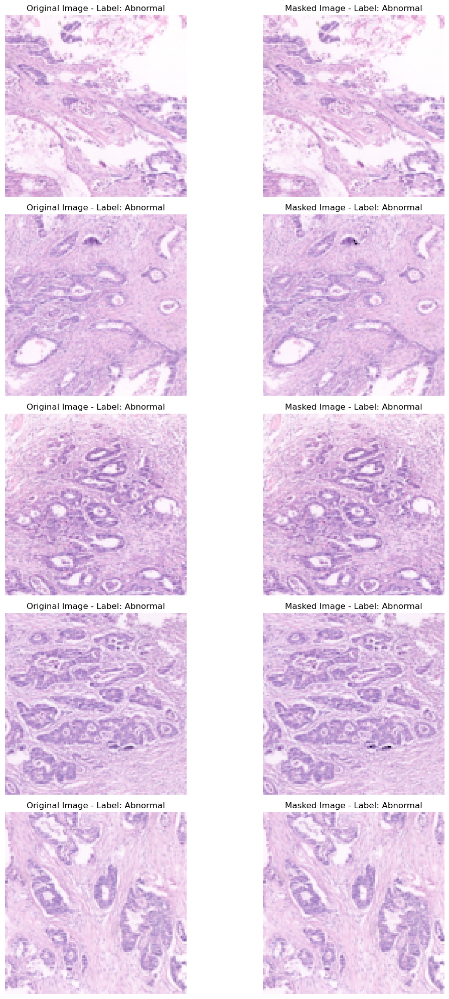

In [90]:
# Show example masked vs. original from test set
from itertools import islice

def visualize_masked_images(imgs, masks, labels, class_names=['Normal', 'Abnormal'], num_samples=5):
    imgs = imgs.cpu().permute(0, 2, 3, 1).numpy()  # (B, H, W, C)
    masks = masks.cpu().permute(0, 2, 3, 1).numpy()

    num_samples = min(num_samples, imgs.shape[0])
    plt.figure(figsize=(12, num_samples * 4))
    for i in range(num_samples):
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(np.clip(imgs[i], 0, 1))
        plt.title(f"Original Image - Label: {class_names[labels[i]]}")
        plt.axis('off')

        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(np.clip(imgs[i] * masks[i], 0, 1))
        plt.title(f"Masked Image - Label: {class_names[labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# === Run visual on a batch from test set ===
test_batch = next(islice(test_loader, 0, 1))  # Get first batch
imgs, paths = test_batch
imgs = imgs.to(device)
labels = [0 if 'normal' in p.lower() else 1 for p in paths]

# Generate masks
with torch.no_grad():
    masks = torch.sigmoid(unet(imgs))
    masks = (masks > 0.6).float()

visualize_masked_images(imgs, masks, labels)

In [89]:
# --- Load U-Net for generating masks ---
unet = UNet().to(device)
unet.load_state_dict(torch.load("./unet_gastric_segmentation.pth"))
unet.eval()

# --- Load original model (trained on unmasked images) ---
original_model = create_gradual_fc_resnet_model().to(device)
original_model.load_state_dict(torch.load("/gpfs/scratch/hz3106/Gashisdb/models/weighted_gradual_fc_gastric_cnn_resnet.pth", weights_only=False))
original_model.eval()

# --- Load masked model (trained with U-Net masked images) ---
masked_model = create_gradual_fc_resnet_model().to(device)
masked_model.load_state_dict(torch.load("/gpfs/scratch/sc11601/DL_projects/jupyter_gpu/classifier_binary0.6.pth"))
masked_model.eval()

# --- Evaluation function ---
def evaluate_model(model, loader, use_mask=False, threshold=0.6):
    correct = 0
    total = 0
    with torch.no_grad():
        for imgs, paths in loader:
            imgs = imgs.to(device)

            # Label from filename
            labels = torch.tensor([0 if 'normal' in p.lower() else 1 for p in paths], dtype=torch.long).to(device)

            if use_mask:
                masks = torch.sigmoid(unet(imgs))
                masks = (masks > threshold).float()
                imgs = imgs * masks  # Apply binary mask

            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return correct / total

# --- Run comparisons ---
original_acc = evaluate_model(original_model, test_loader, use_mask=False)
masked_acc = evaluate_model(masked_model, test_loader, use_mask=True, threshold=0.6)

print(f"Original Model Test Accuracy: {original_acc:.4f}")
print(f"Masked Model Test Accuracy : {masked_acc:.4f}")

RuntimeError: Error(s) in loading state_dict for ResNet:
	Missing key(s) in state_dict: "conv1.weight", "bn1.weight", "bn1.bias", "bn1.running_mean", "bn1.running_var", "layer1.0.conv1.weight", "layer1.0.bn1.weight", "layer1.0.bn1.bias", "layer1.0.bn1.running_mean", "layer1.0.bn1.running_var", "layer1.0.conv2.weight", "layer1.0.bn2.weight", "layer1.0.bn2.bias", "layer1.0.bn2.running_mean", "layer1.0.bn2.running_var", "layer1.1.conv1.weight", "layer1.1.bn1.weight", "layer1.1.bn1.bias", "layer1.1.bn1.running_mean", "layer1.1.bn1.running_var", "layer1.1.conv2.weight", "layer1.1.bn2.weight", "layer1.1.bn2.bias", "layer1.1.bn2.running_mean", "layer1.1.bn2.running_var", "layer2.0.conv1.weight", "layer2.0.bn1.weight", "layer2.0.bn1.bias", "layer2.0.bn1.running_mean", "layer2.0.bn1.running_var", "layer2.0.conv2.weight", "layer2.0.bn2.weight", "layer2.0.bn2.bias", "layer2.0.bn2.running_mean", "layer2.0.bn2.running_var", "layer2.0.downsample.0.weight", "layer2.0.downsample.1.weight", "layer2.0.downsample.1.bias", "layer2.0.downsample.1.running_mean", "layer2.0.downsample.1.running_var", "layer2.1.conv1.weight", "layer2.1.bn1.weight", "layer2.1.bn1.bias", "layer2.1.bn1.running_mean", "layer2.1.bn1.running_var", "layer2.1.conv2.weight", "layer2.1.bn2.weight", "layer2.1.bn2.bias", "layer2.1.bn2.running_mean", "layer2.1.bn2.running_var", "layer3.0.conv1.weight", "layer3.0.bn1.weight", "layer3.0.bn1.bias", "layer3.0.bn1.running_mean", "layer3.0.bn1.running_var", "layer3.0.conv2.weight", "layer3.0.bn2.weight", "layer3.0.bn2.bias", "layer3.0.bn2.running_mean", "layer3.0.bn2.running_var", "layer3.0.downsample.0.weight", "layer3.0.downsample.1.weight", "layer3.0.downsample.1.bias", "layer3.0.downsample.1.running_mean", "layer3.0.downsample.1.running_var", "layer3.1.conv1.weight", "layer3.1.bn1.weight", "layer3.1.bn1.bias", "layer3.1.bn1.running_mean", "layer3.1.bn1.running_var", "layer3.1.conv2.weight", "layer3.1.bn2.weight", "layer3.1.bn2.bias", "layer3.1.bn2.running_mean", "layer3.1.bn2.running_var", "layer4.0.conv1.weight", "layer4.0.bn1.weight", "layer4.0.bn1.bias", "layer4.0.bn1.running_mean", "layer4.0.bn1.running_var", "layer4.0.conv2.weight", "layer4.0.bn2.weight", "layer4.0.bn2.bias", "layer4.0.bn2.running_mean", "layer4.0.bn2.running_var", "layer4.0.downsample.0.weight", "layer4.0.downsample.1.weight", "layer4.0.downsample.1.bias", "layer4.0.downsample.1.running_mean", "layer4.0.downsample.1.running_var", "layer4.1.conv1.weight", "layer4.1.bn1.weight", "layer4.1.bn1.bias", "layer4.1.bn1.running_mean", "layer4.1.bn1.running_var", "layer4.1.conv2.weight", "layer4.1.bn2.weight", "layer4.1.bn2.bias", "layer4.1.bn2.running_mean", "layer4.1.bn2.running_var", "fc.0.weight", "fc.0.bias", "fc.1.weight", "fc.1.bias", "fc.1.running_mean", "fc.1.running_var", "fc.4.weight", "fc.4.bias", "fc.5.weight", "fc.5.bias", "fc.5.running_mean", "fc.5.running_var", "fc.8.weight", "fc.8.bias", "fc.9.weight", "fc.9.bias", "fc.9.running_mean", "fc.9.running_var", "fc.12.weight", "fc.12.bias", "fc.13.weight", "fc.13.bias", "fc.13.running_mean", "fc.13.running_var", "fc.16.weight", "fc.16.bias", "fc.17.weight", "fc.17.bias", "fc.17.running_mean", "fc.17.running_var", "fc.20.weight", "fc.20.bias", "fc.21.weight", "fc.21.bias", "fc.21.running_mean", "fc.21.running_var", "fc.24.weight", "fc.24.bias", "fc.25.weight", "fc.25.bias", "fc.25.running_mean", "fc.25.running_var", "fc.28.weight", "fc.28.bias". 
	Unexpected key(s) in state_dict: "model_state_dict", "class_weights", "metrics", "optimizer_state_dict", "training_history". 